# Test AGM-TE on electrophysiological data from the Allen Institute for Brain Science

In [1]:
from dataset import DataSet
from mlmodel import RNNDynamicsModel, train_RNNDynamicsModel, plot_RNNDynamicsModel_pred, dynamicsmodel_from_loader
import numpy as np
import pickle
import matplotlib.pyplot as plt

In [2]:
import torch; torch.set_printoptions(sci_mode=None)
# Check if CUDA is available
if torch.cuda.is_available():
    compute_device = torch.device("cuda")
    print("CUDA is available. Using GPU.")
else:
    compute_device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

CUDA is available. Using GPU.


## Load in the electrophyiological data recorded from the brain of a mouse

In [20]:
#allen_datadict = pickle.load(open('../AllenData/allen_neurodata_1ms.pkl', 'rb'))
allen_datadict = pickle.load(open('../AllenData/test_neurodatadict_stim_bin_100ms.pkl', 'rb'))
allen_dataset = DataSet(allen_datadict)
print(allen_dataset)

DataSet of 16000 timesteps across 16 trajectories for 8 variables:
	 V1 is 93 dimensional
	 LM is 56 dimensional
	 RL is 58 dimensional
	 AL is 43 dimensional
	 PM is 17 dimensional
	 AM is 49 dimensional
	 LGN is 8 dimensional
	 LP is 9 dimensional



## Demonstrate how the system can learn the underlying neural dynamics, and estimate CTE between two brain regions

In [22]:
dataloader_1, dataloader_2 = allen_dataset.get_CTE_dataloaders(compute_device, var_from='V1', var_to='AM', var_cond='remaining', batch_size=8)

Epoch [5000/5000], Loss: 4.8299643993377686         


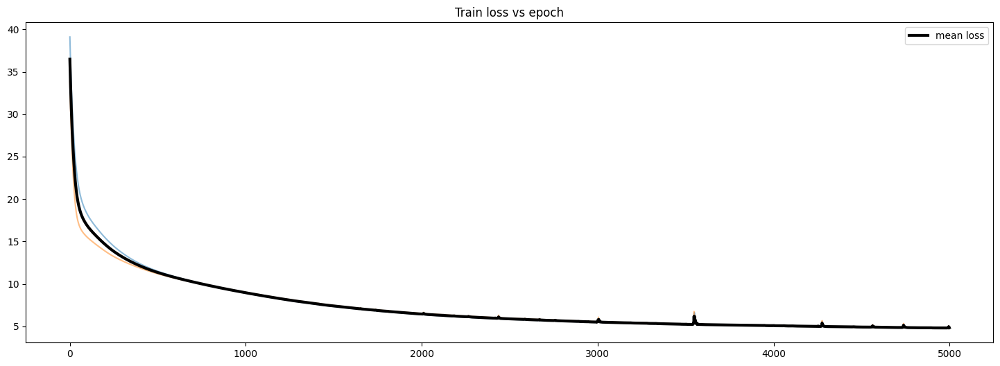

Epoch [5000/5000], Loss: 4.333592891693115          


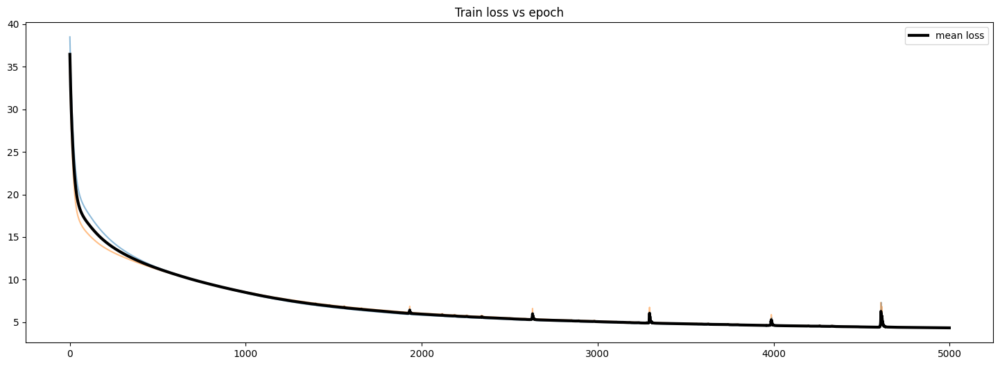

0.5393


In [24]:
model_1 = dynamicsmodel_from_loader(dataloader_1, rnn_type='GRU', model_type='poisson', hidden_size=50, num_layers=1, device=compute_device)
model_1, loss_1 = train_RNNDynamicsModel(model_1, dataloader_1, epochs=5000, learning_rate=0.0002, plot=True)  

model_2 = dynamicsmodel_from_loader(dataloader_2, rnn_type='GRU', model_type='poisson', hidden_size=50, num_layers=1, device=compute_device)
model_2, loss_2 = train_RNNDynamicsModel(model_2, dataloader_2, epochs=5000, learning_rate=0.0002, plot=True)

print(round(loss_1 - loss_2, 4))

(999, 49)


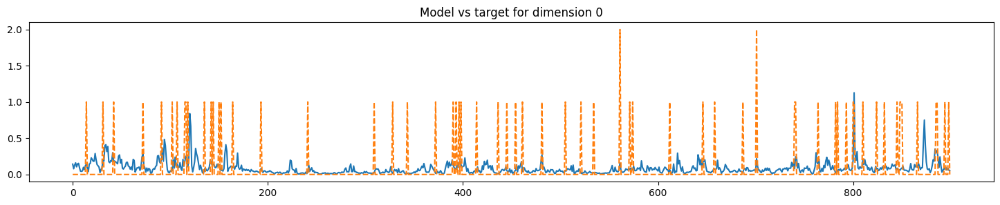

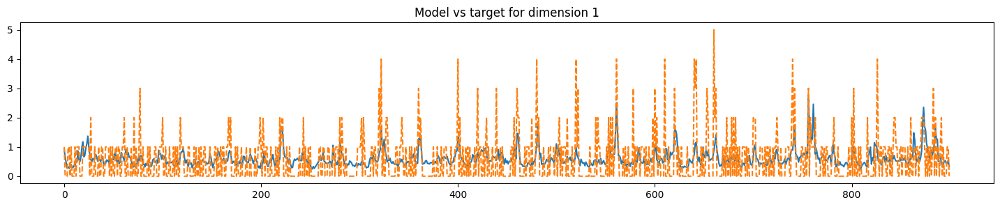

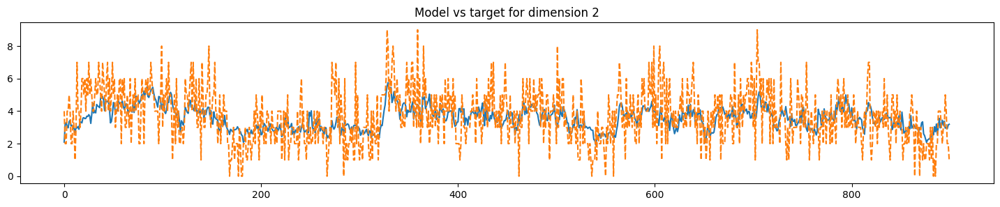

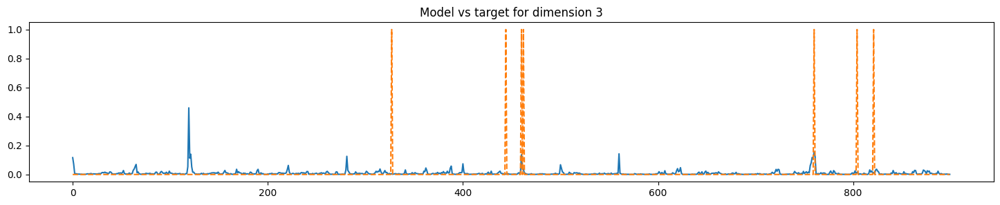

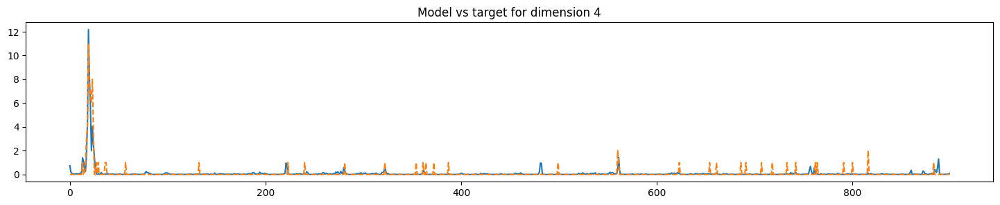

...

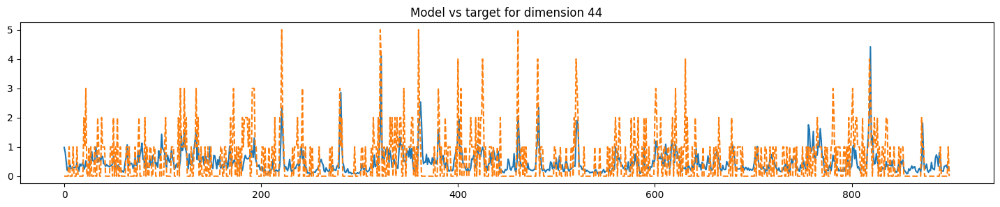

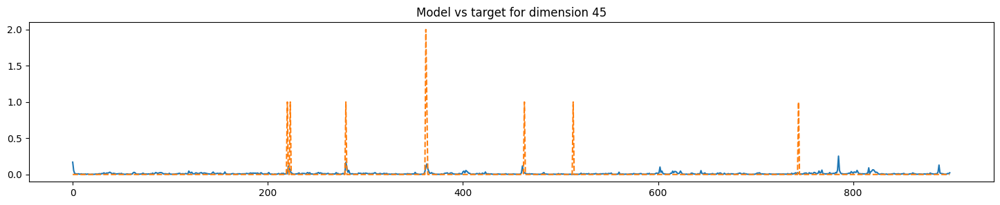

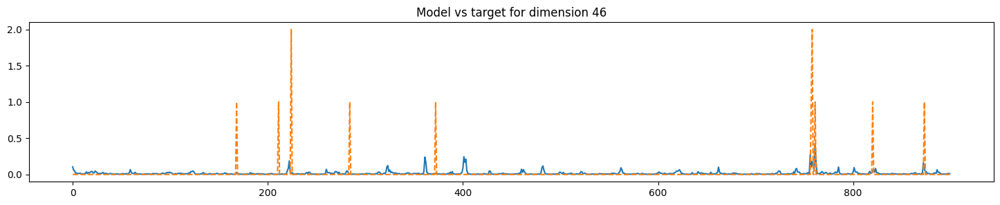

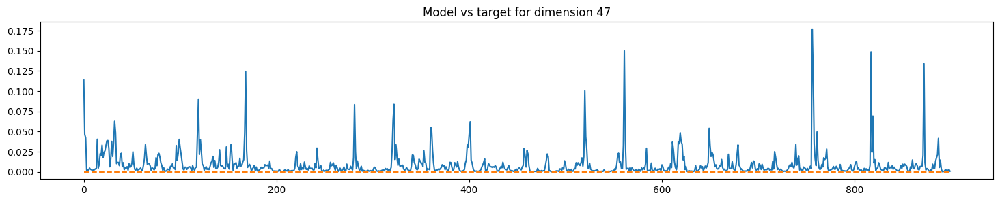

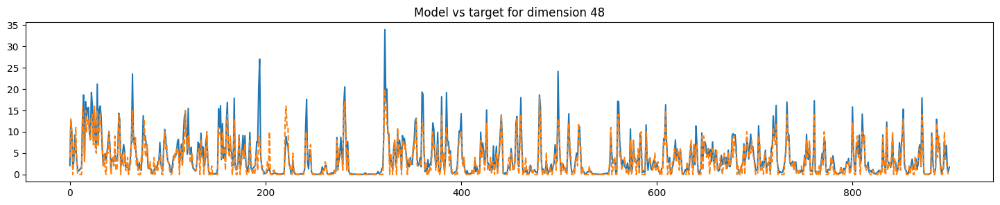

(999, 49)


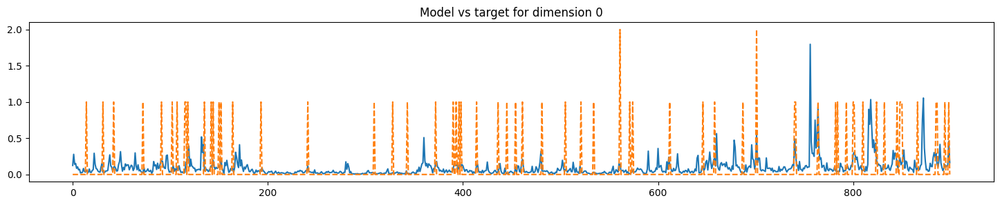

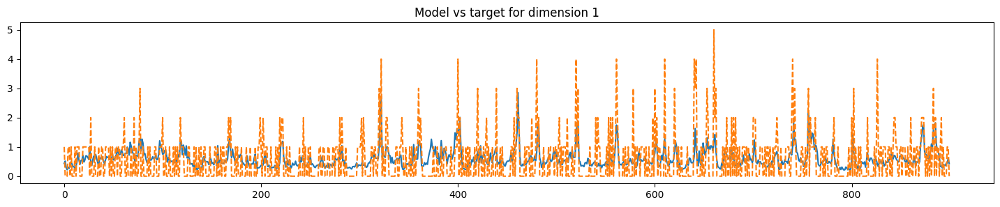

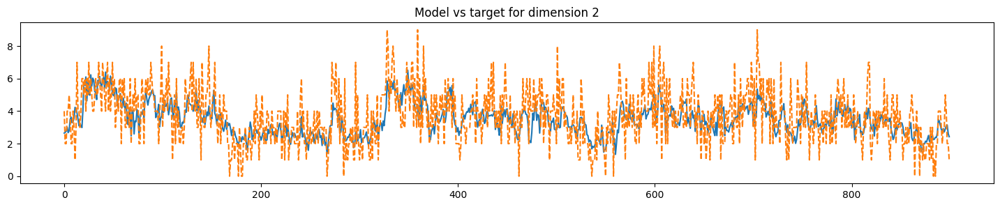

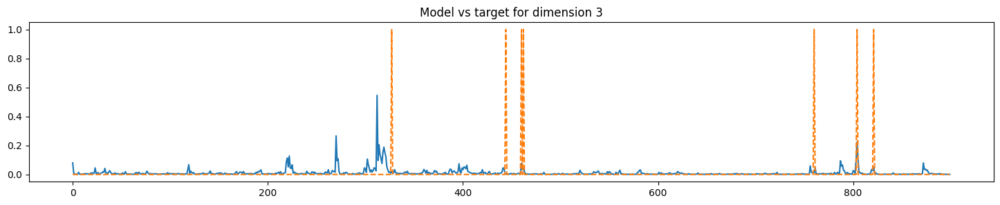

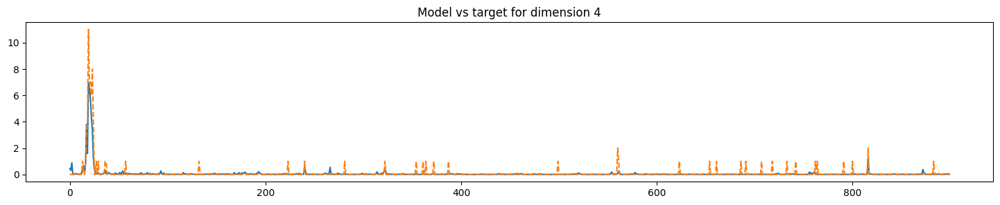

...

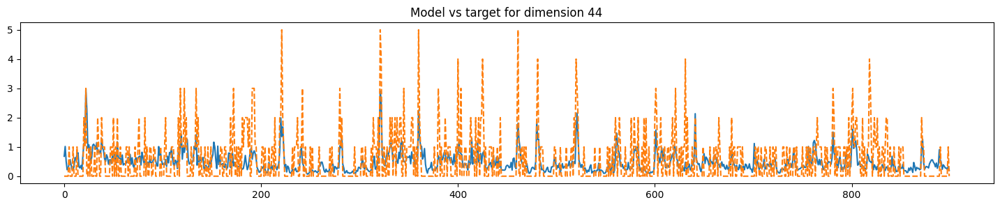

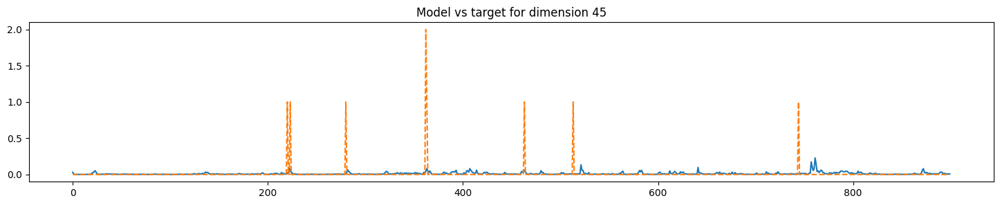

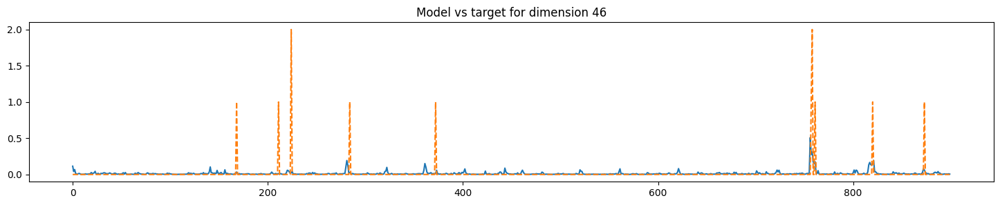

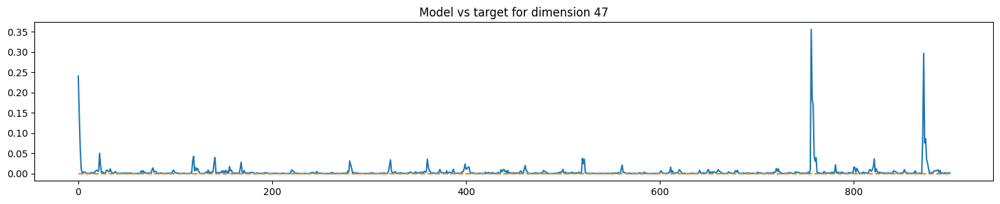

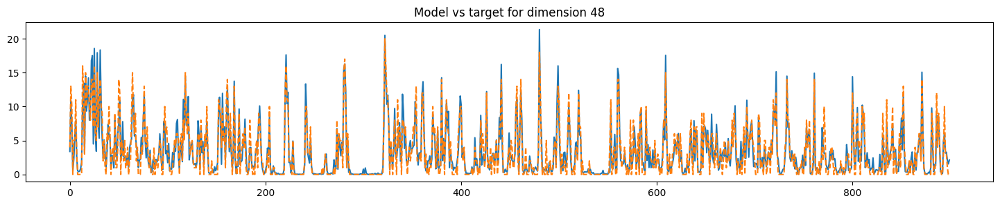

In [25]:
plot_RNNDynamicsModel_pred(model_1, dataloader_1[0][0][1,:,:], dataloader_1[0][1][1,:,:], 0, plot_end=900, by_dim=True)
plot_RNNDynamicsModel_pred(model_2, dataloader_2[0][0][1,:,:], dataloader_2[0][1][1,:,:], 0, plot_end=900, by_dim=True)

## Estimate CTE across the 6 anatomical areas

In [7]:
from itertools import permutations
areas_list = ['V1', 'RL', 'LM', 'AL', 'PM', 'AM']
areas_index = [0, 1, 2, 3, 4, 5]

index_combinations = list(permutations(areas_index, 2))
print('there are ',len(index_combinations), 'combinations of areas in the Allen dataset for which we can compute the CTE')

CTE_table = np.zeros((len(areas_list), len(areas_list)))

there are  30 combinations of areas in the Allen dataset for which we can compute the CTE


In [26]:
for var_from_idx, var_to_idx in index_combinations:
    var_from = areas_list[var_from_idx]
    var_to = areas_list[var_to_idx]

    print(f"\n>>> Estimating CTE from {var_from} to {var_to} <<<")

    dataloader_1, dataloader_2 = allen_dataset.get_CTE_dataloaders(compute_device, var_from=var_from, var_to=var_to, var_cond='remaining', batch_size=8)
    model_1 = dynamicsmodel_from_loader(dataloader_1, rnn_type='GRU', model_type='poisson', hidden_size=50, num_layers=1, device=compute_device)
    model_1, loss_1 = train_RNNDynamicsModel(model_1, dataloader_1, epochs=5000, learning_rate=0.0002, plot=False)  

    model_2 = dynamicsmodel_from_loader(dataloader_2, rnn_type='GRU', model_type='poisson', hidden_size=50, num_layers=1, device=compute_device)
    model_2, loss_2 = train_RNNDynamicsModel(model_2, dataloader_2, epochs=5000, learning_rate=0.0002, plot=False)

    CTE = round(loss_1 - loss_2, 4)
    CTE_table[var_from_idx, var_to_idx] = CTE

    print(f"> CTE from {var_from} to {var_to}: {CTE} <")

print(CTE_table)


>>> Estimating CTE from V1 to RL <<<
Epoch [5000/5000], Loss: -1.5247002840042114           
Epoch [5000/5000], Loss: -2.2044606506824493           
> CTE from V1 to RL: 0.6734 <

>>> Estimating CTE from V1 to LM <<<
Epoch [5000/5000], Loss: 19.408488273620605         
Epoch [5000/5000], Loss: 18.94363307952881          
> CTE from V1 to LM: 0.5014 <

>>> Estimating CTE from V1 to AL <<<
Epoch [5000/5000], Loss: -1.2633767873048782           
Epoch [5000/5000], Loss: -1.7118028551340103           
> CTE from V1 to AL: 0.4518 <

>>> Estimating CTE from V1 to PM <<<
Epoch [5000/5000], Loss: 0.3100133016705513          
Epoch [5000/5000], Loss: 0.01763281226158142          
> CTE from V1 to PM: 0.288 <

>>> Estimating CTE from V1 to AM <<<
Epoch [5000/5000], Loss: 4.7797160148620605         
Epoch [5000/5000], Loss: 4.2673444747924805         
> CTE from V1 to AM: 0.518 <

>>> Estimating CTE from RL to V1 <<<
Epoch [5000/5000], Loss: -2.352539896965027            
Epoch [5000/5000], Loss

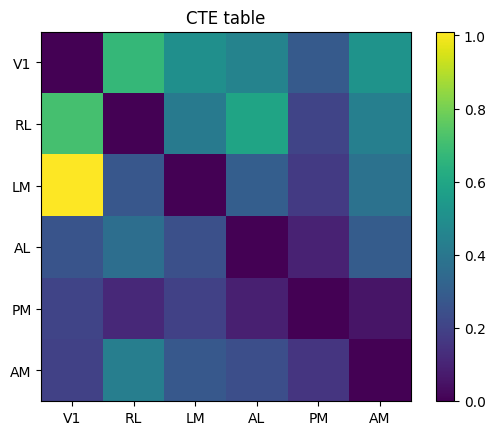

In [27]:
plt.imshow(CTE_table, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.xticks(areas_index, areas_list)
plt.yticks(areas_index, areas_list)
plt.title('CTE table')
plt.show()